# Importing Libraries  


In [1]:
import pandas as pd
import numpy as np

from PIL import Image, ImageFilter, ImageDraw

from patchify import patchify

from osgeo import gdal

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

import os

import utils

import tifffile as tiff

from glob import glob
from scipy.io import loadmat
from scipy.io import savemat

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import dask.array as da
import dask

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import plotly.graph_objects as go


np.seterr(divide='ignore', invalid='ignore')


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

### Displaying Folder contents


In [2]:

for dirname, _, filenames in os.walk("REQNO_17-46248(ALLAHABAD)/Fol2_174624821"):
    for filename in filenames:
        print(os.path.join(dirname, filename))



REQNO_17-46248(ALLAHABAD)/Fol2_174624821\ACC_REP.txt
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND2.jpg
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND2.tif
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND3.jpg
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND3.tif
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND4.jpg
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND4.tif
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\BAND_META.txt
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\CDINFO
REQNO_17-46248(ALLAHABAD)/Fol2_174624821\desktop.ini


### Setting Folder Path

In [3]:
%cd C:\Users\Subeg Singh\desktop\satellite_image_classification\REQNO_17-46248(ALLAHABAD)\Fol2_174624821

C:\Users\Subeg Singh\desktop\satellite_image_classification\REQNO_17-46248(ALLAHABAD)\Fol2_174624821


### Return a list of paths matching a pathname pattern.

In [4]:
S_sentinel_bands = glob('C:/Users/Subeg Singh/desktop/satellite_image_classification/REQNO_17-46248(ALLAHABAD)/Fol2_174624821/*B?*.tif')
S_sentinel_bands.sort()
S_sentinel_bands

['C:/Users/Subeg Singh/desktop/satellite_image_classification/REQNO_17-46248(ALLAHABAD)/Fol2_174624821\\BAND2.tif',
 'C:/Users/Subeg Singh/desktop/satellite_image_classification/REQNO_17-46248(ALLAHABAD)/Fol2_174624821\\BAND3.tif',
 'C:/Users/Subeg Singh/desktop/satellite_image_classification/REQNO_17-46248(ALLAHABAD)/Fol2_174624821\\BAND4.tif']

### Storing data in a list 

In [5]:


l = []
for i in S_sentinel_bands:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))

### Converting list to array

In [6]:
arr_st1 = np.stack(l)


In [7]:
arr_st1

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16)

In [8]:
arr_st1.shape

(3, 16520, 18438)

### Using dask module (to convert numpy array into dask array for parallel and faster processing )

In [9]:
arr_d1 = da.from_array(arr_st1, chunks='auto', asarray=None, fancy= False )

In [10]:
arr_d1

dask.array<array, shape=(3, 16520, 18438), dtype=uint16, chunksize=(3, 4729, 4729), chunktype=numpy.ndarray>

### Printing out Bands

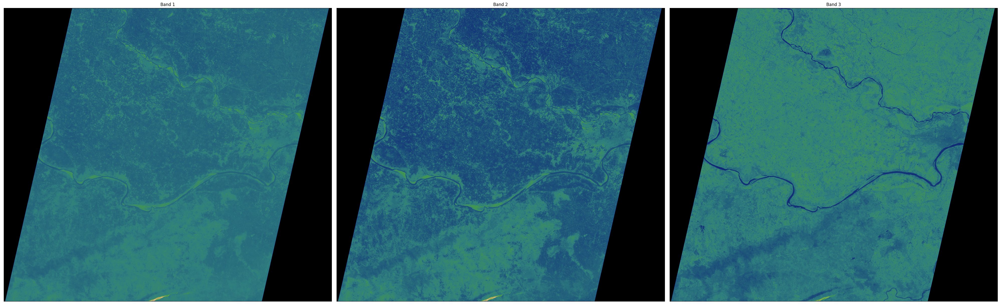

In [11]:

ep.plot_bands(arr_st1, cmap = 'gist_earth', figsize = (40, 15), cols = 3, cbar = False)
plt.show()

### histogram for each layer in a numpy array.


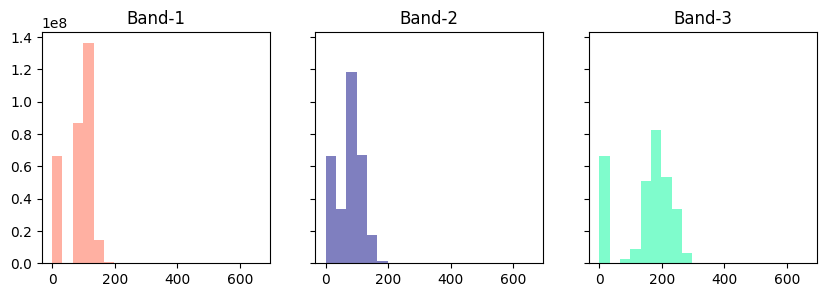

In [12]:
colors = ['tomato', 'navy', 'MediumSpringGreen']
ep.hist(arr_st1, 
         colors = colors,
        title=[f'Band-{i}' for i in range(1, 4)], 
        cols=3, 
        alpha=0.5, 
        figsize = (10, 3)
        )

plt.show()
     

# Vegetation and soils indices

### Normalized Difference Vegetation Index (NDVI)

#### NDVI = ((NIR - Red)/(NIR + Red))

- NIR = pixel values from the near-infrared band
- Red = pixel values from the red band

C:\Users\Subeg Singh\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Subeg Singh\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


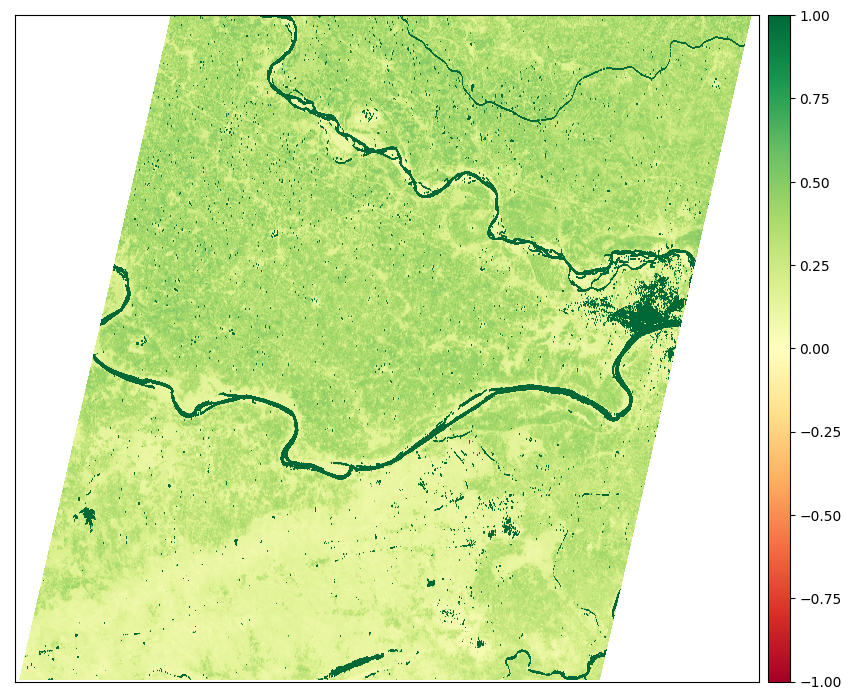

In [13]:
ndvi = es.normalized_diff(arr_d1[2], arr_d1[0])

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()


# Soil-Adjusted Vegetation Index (SAVI)

### SAVI = ((NIR - Red) / (NIR + Red + L)) x (1 + L)

##### L = amount of green vegetation cover

- NIR = pixel values from the near infrared band
- Red = pixel values from the near red band


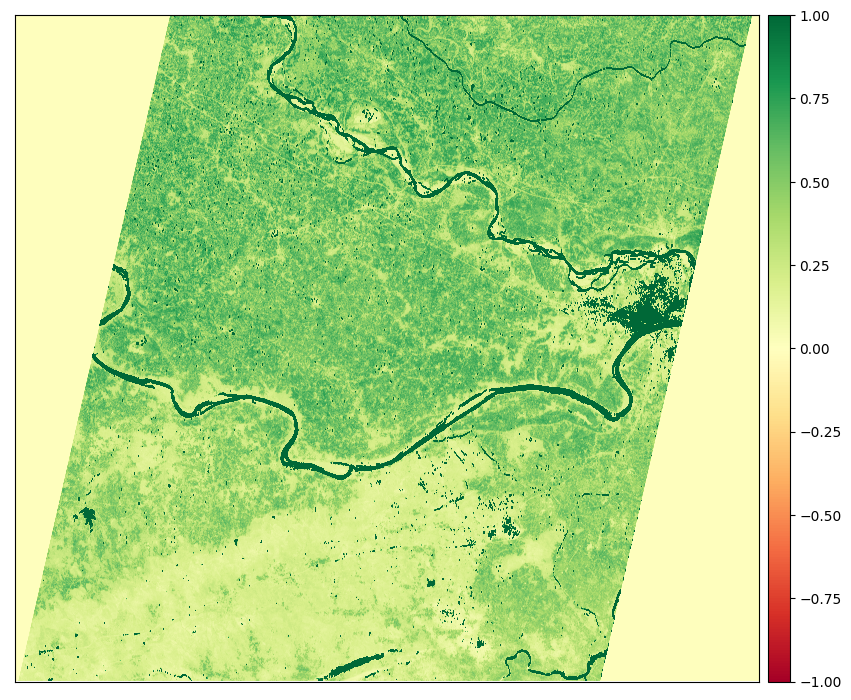

In [15]:

L = 0.5

savi = ((arr_d1[2] - arr_d1[0]) / (arr_d1[2] + arr_d1[0] + L)) * (1 + L)

ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Visible Atmospherically Resistant Index (VARI)

### VARI = (Green - Red)/ (Green + Red - Blue)

- Green = pixel values from the green band
- Red= pixel values from the red band
- Blue = pixel values from the blue band

C:\Users\Subeg Singh\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


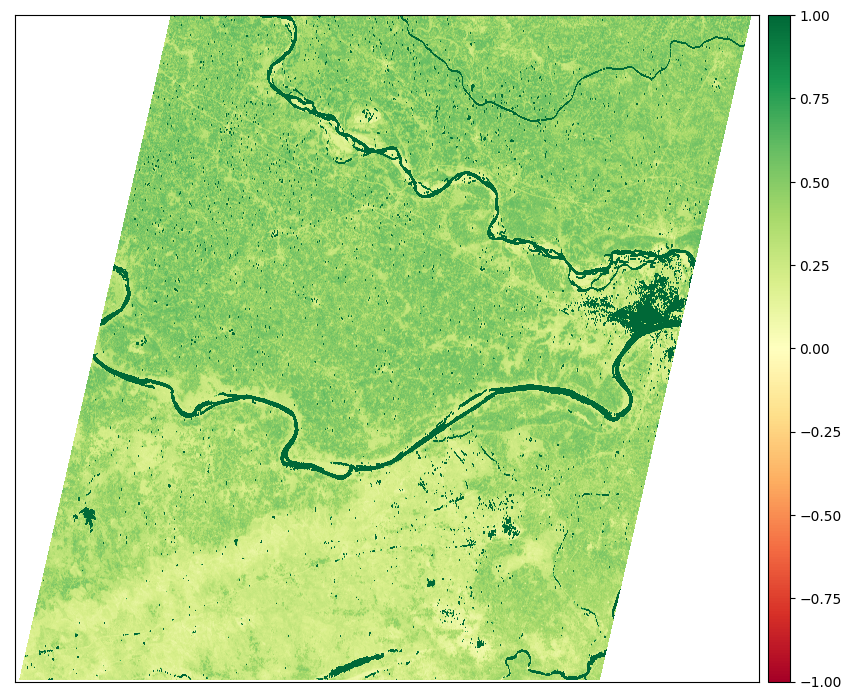

In [16]:
#Visible Atmospherically Resistant Index (VARI)

vari = (arr_d1[2] - arr_d1[0])/ (arr_d1[2] + arr_d1[0] - arr_d1[1])

ep.plot_bands(vari, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Water Indices

### Modified Normalized Difference Water Index (MNDWI)

- MNDWI = (Green - SWIR) / (Green + SWIR)

- Green = pixel values from the green band

- SWIR = pixel values from the short-wave infrared band

C:\Users\Subeg Singh\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Subeg Singh\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


MemoryError: Unable to allocate 290. MiB for an array with shape (16520, 18438) and data type bool

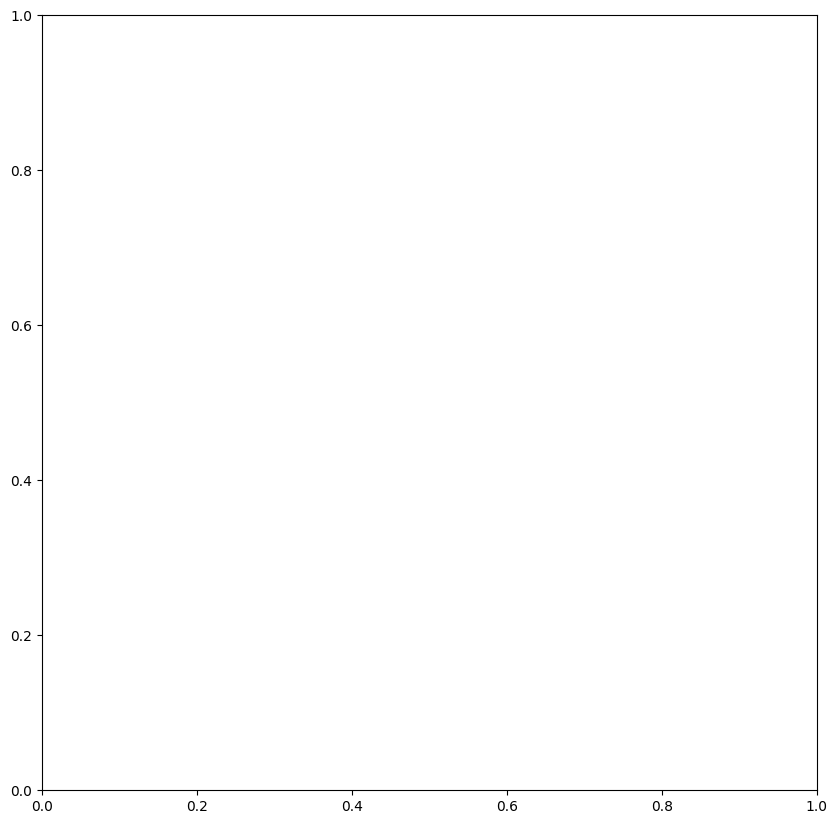

In [18]:
#mndwi = es.normalized_diff(arr_st[0], arr_st[2])

mndwi = es.normalized_diff(arr_d1[0], arr_d1[2])
ep.plot_bands(mndwi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Normalized Difference Moisture Index (NDMI)

#### NDMI = (NIR - SWIR1)/(NIR + SWIR1)

- NIR = pixel values from the near infrared band
- SWIR1 = pixel values from the short-wave infrared 1 band

In [ ]:
ndmi = es.normalized_diff(arr_d1[0], arr_d1[1])

ep.plot_bands(ndmi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()
     

# Geology Indices

## Clay Minerals

### Clay Minerals Ratio = SWIR1 / SWIR2

- SWIR1 = pixel values from the short-wave infrared 1 band
- SWIR2 = pixel values from the short-wave infrared 2 band

In [ ]:
cmr = np.divide(arr_d1[1], arr_d1[2])
     

ep.plot_bands(cmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()


# Ferrous Minerals
  ## Ferrous Minerals Ratio = SWIR / NIR
  
  - SWIR= pixel values from the short-wave infrared band
  - NIR = pixel values from the near infrared band

In [ ]:
fmr = np.divide(arr_d1[1], arr_d1[0])
     

ep.plot_bands(fmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()